In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
from pybedtools import BedTool
import pybedtools
import pandas as pd
import numpy as np
import dask.dataframe as dd
import warnings
from pathlib import Path
warnings.filterwarnings("ignore")

pybedtools.set_tempdir("/storage/home/nmc6088/scratch")
pybedtools.helpers.set_bedtools_path("/storage/group/izg5139/default/nicole/miniconda3/bin")

df_centro = pd.read_table("/storage/group/izg5139/default/external/quadrupia_database/g4/nonBDNA/primates/centromeres/chm13v2.0_censat_v2.0.bed", 
                          usecols=range(4), 
                          skiprows=1, 
                          header=None, 
                          names=["seqID", "start", "end", "compartment"]
                         )
df_centro.loc[:, "compartment"] = df_centro["compartment"].str.split("_", expand=True)[0]

chrSizes = dd.read_table("/storage/group/izg5139/default/external/quadrupia_database/g4/nonBDNA/primates/chrSizes/chromosome_prim*.txt").compute()
chrSizes.loc[:, "#assembly_accession"] = chrSizes["#assembly_accession"].apply(lambda y: '.'.join(y.split('.')[:2]))

chromosomes = chrSizes[chrSizes['#assembly_accession'] == 'chm13v2.0']\
                .drop(columns=["#assembly_accession"])

df_centro = df_centro.merge(chromosomes, how="left", left_on="seqID", right_on="chromosome")
extended_avoidmers = {f.name.split("_")[7].split(".")[0]: f for f in Path("/storage/group/izg5139/default/external/satellites/primates/zimming_extended").glob("*.txt")}

df_all = []
from tqdm import tqdm
for chromosome in tqdm(extended_avoidmers, total=24):
    df = pd.read_csv(extended_avoidmers[chromosome], 
                     header=None, 
                     names=["seqID", "start", "end", "sequence", "length"]
                    )
    df_all.append(df)

df_all = pd.concat(df_all, axis=0)
df_all = df_all.merge(chrSizes, how="left", left_on="seqID", right_on="chromosome")
df_all

/tmp/ipykernel_2588775/1468106784.py:5: DeprecationWarning: The current Dask DataFrame implementation is deprecated. 
In a future release, Dask DataFrame will use a new implementation that
contains several improvements including a logical query planning.
The user-facing DataFrame API will remain unchanged.

The new implementation is already available and can be enabled by
installing the dask-expr library:

    $ pip install dask-expr

and turning the query planning option on:

    >>> import dask
    >>> dask.config.set({'dataframe.query-planning': True})
    >>> import dask.dataframe as dd

API documentation for the new implementation is available at
https://docs.dask.org/en/stable/dask-expr-api.html

Any feedback can be reported on the Dask issue tracker
https://github.com/dask/dask/issues 

To disable this warning in the future, set dask config:

    # via Python
    >>> dask.config.set({'dataframe.query-planning-warning': False})

    # via CLI
    dask config set dataframe.query-p

,seqID,start,end,sequence,length,#assembly_accession,chromosome,chrLen
0,chr1,6006,6066,ccagatgcaactgcccaatctcggacattccagctaccagtattgt...,60,chm13v2.0,chr1,248387328
1,chr1,12615,12676,ccttgaagcacccccaagggcatcttctcaaagttggatgtgtgca...,61,chm13v2.0,chr1,248387328
2,chr1,12616,12676,cttgaagcacccccaagggcatcttctcaaagttggatgtgtgcat...,60,chm13v2.0,chr1,248387328
3,chr1,21609,21674,tcacaatggaccaggccaactcagtcaatgtggaggcagcatcagg...,65,chm13v2.0,chr1,248387328
4,chr1,21610,21674,cacaatggaccaggccaactcagtcaatgtggaggcagcatcaggt...,64,chm13v2.0,chr1,248387328
...,...,...,...,...,...,...,...,...
3187304,chrY,62439239,62439299,ccacaaggtcaggagttcaataccagcctggccaagatggtgaaac...,60,chm13v2.0,chrY,62460029
3187305,chrY,62442141,62442201,aatacaaaaattagctgggcatggcggcacgtgcctgtaatcccag...,60,chm13v2.0,chrY,62460029
3187306,chrY,62444746,62444806,gaactatgtgacgaatgcacaagctttagtagccgatgcgatcaac...,60,chm13v2.0,chrY,62460029
3187307,chrY,62453292,62453353,tgcgttctgctcagtacagacctgggggtcaccgtaaaggtggagc...,61,chm13v2.0,chrY,62460029


In [70]:
for seqID, seq in all.set_index("seqID")['sequence'].to_dict().items():

    temp = df_all[(df_all["seqID"] == seqID) & (df_all['sequence'] == seq)].iloc[0]
    
    # print(temp)
    print(temp['seqID'], temp['start'], temp['end'], temp['sequence'], temp['length'])

chr1 157149 157239 gaatatgggactagcccaggccaggcatggtggctcatgcctgaaattccagccattacagaagctaatgcaggaggattgcttaaggcc 90
chr10 27417153 27417245 tatgattccgtgtggcatcctaagctagagcataaaggacattttggcttccattctcttggatcacttggtccaggggaatccggcagctg 92
chr11 10481584 10481683 gcaaggcatggctaggccagcttccacagttcctgcttgctctctggagcaggacttttaaaacctgggttcatggatggactgtgtattagtccgttc 99
chr12 3417493 3417584 gtgattttcctccagaaagtacatatgcttgcttctggctgttagctagtccaagggtaggccaccttaattcagccaggaatcggcatgc 91
chr13 39003412 39003506 gatgaactgccagggactaggcaggaattggagtgaaggcccagtctcaggtccttggccttgatcatggccaaccgcaatatgcttcagcctt 94
chr14 17101109 17101199 aactgctgggattacaggtgtgagccaccgcgcctggccaaattttagttaagtactaggaatctggaactcctaattccaggcttaaga 90
chr15 28913008 28913099 gcattcagtccgttgcatgacagattaaaaaataacttactggccaggcgcagtggttcatgcctgtaatcccagcactttgggaggccga 91
chr16 2997655 2997747 tgataagtaaccagtgccaaaagccttttgcccagggcctgtctctggccaaggccaggccgccaactggatgacagcattacctggacctg 92
chr17 1732636 1732727 tgaatcaagttttctgtcctagaa

In [63]:
all = df_all.query("length >= 90").groupby(["seqID"], as_index=False).agg({"sequence": "first"})

for seq in all.sequence:
    print(seq)

gaatatgggactagcccaggccaggcatggtggctcatgcctgaaattccagccattacagaagctaatgcaggaggattgcttaaggcc
tatgattccgtgtggcatcctaagctagagcataaaggacattttggcttccattctcttggatcacttggtccaggggaatccggcagctg
gcaaggcatggctaggccagcttccacagttcctgcttgctctctggagcaggacttttaaaacctgggttcatggatggactgtgtattagtccgttc
gtgattttcctccagaaagtacatatgcttgcttctggctgttagctagtccaagggtaggccaccttaattcagccaggaatcggcatgc
gatgaactgccagggactaggcaggaattggagtgaaggcccagtctcaggtccttggccttgatcatggccaaccgcaatatgcttcagcctt
aactgctgggattacaggtgtgagccaccgcgcctggccaaattttagttaagtactaggaatctggaactcctaattccaggcttaaga
gcattcagtccgttgcatgacagattaaaaaataacttactggccaggcgcagtggttcatgcctgtaatcccagcactttgggaggccga
tgataagtaaccagtgccaaaagccttttgcccagggcctgtctctggccaaggccaggccgccaactggatgacagcattacctggacctg
tgaatcaagttttctgtcctagaacatccgtcccattactacggggaatagtccgccgcgttatcgactgctcatgagtgatggattgaac
ccaaggcttggaacatgcggaccagcccagtagccaatgcaattagttgatcaatacgaactcctgtgtgccacttggccttctaagggctgacgctac
gaatatgggactagcccaggccaggcatggtggctcatgcctgaaattccagccattacag

In [4]:
df_all.loc[:, "gc_content"] = df_all['sequence'].str.count("g|c").div(df_all["sequence"].apply(len))
df_all.loc[:, "gt_content"] = df_all['sequence'].str.count("g|t").div(df_all["sequence"].apply(len))

<Axes: xlabel='length', ylabel='gt_content'>

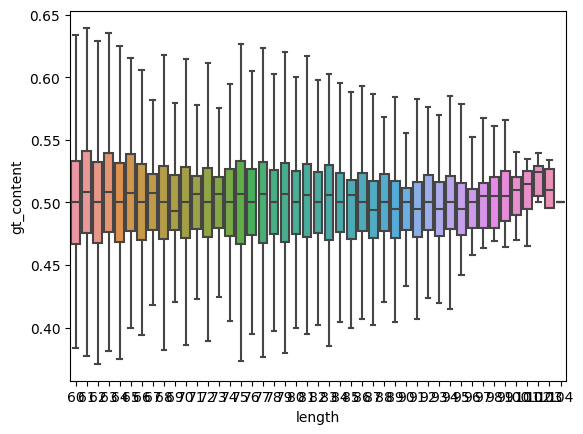

In [5]:
sns.boxplot(data=df_all, x="length", y="gt_content", showfliers=False)

<Axes: xlabel='length', ylabel='gc_content'>

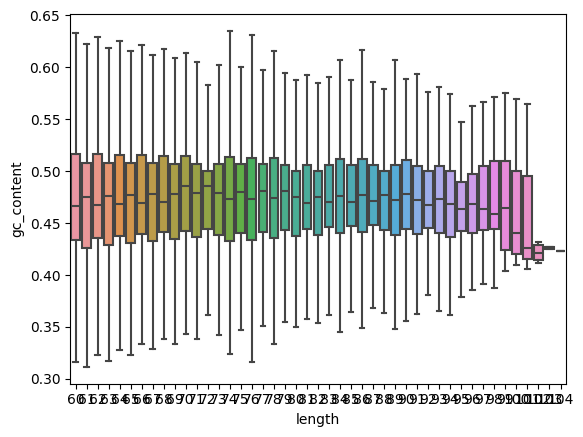

In [6]:
sns.boxplot(data=df_all, x="length", y="gc_content", showfliers=False)

In [53]:
"aaaaacacacaca".count("ca")

4

In [124]:
from collections import defaultdict

dinucleotides = {
                 "tt": "aa",
                 "cc": "gg",
                 "ac": "gt",
                 "ag": "ct",
                 "tc": "ga",
                 "ca": "tg",
                }
# dinucleotides = {x: y for y, x in dinucleotides.items()}
dinucleotides_all = ["aa", "gg", "gt", "ct", "ga", "tg", "ta", "at", "gc", "cg"]
dinucleotides_all = ["aa", "gg", "gt", "ct", "ga", "tg", "ta", "at", "gc", "cg", "tt", "cc", "ac", "ag", "tc", "ca"]

def calculate_dinucleotides(seq):
    dinu_counts = defaultdict(int)
    for i in range(len(seq)-1):
        chunk = seq[i:i+2]
        # if chunk in dinucleotides:
        #    chunk = dinucleotides[chunk]

        dinu_counts[chunk] += 1
    return dinu_counts

df_all.loc[:, "dinucleotides"] = df_all["sequence"].apply(calculate_dinucleotides)
df_all

,seqID,start,end,sequence,length,#assembly_accession,chromosome,chrLen,gc_content,gt_content,...,gt,ct,ga,tg,ta,at,gc,cg,total,dinucleotides
0,chr1,6006,6066,ccagatgcaactgcccaatctcggacattccagctaccagtattgt...,60,chm13v2.0,chr1,248387328,0.483333,0.400000,...,0.084746,0.118644,0.135593,0.203390,0.033898,0.101695,0.067797,0.016949,1.0,"{'cc': 6, 'ca': 7, 'ag': 4, 'ga': 4, 'at': 6, ..."
1,chr1,12615,12676,ccttgaagcacccccaagggcatcttctcaaagttggatgtgtgca...,61,chm13v2.0,chr1,248387328,0.491803,0.508197,...,0.066667,0.150000,0.150000,0.183333,0.000000,0.050000,0.050000,0.000000,1.0,"{'cc': 6, 'ct': 4, 'tt': 6, 'tg': 6, 'ga': 5, ..."
2,chr1,12616,12676,cttgaagcacccccaagggcatcttctcaaagttggatgtgtgcat...,60,chm13v2.0,chr1,248387328,0.483333,0.516667,...,0.067797,0.152542,0.152542,0.186441,0.000000,0.050847,0.050847,0.000000,1.0,"{'ct': 4, 'tt': 6, 'tg': 6, 'ga': 5, 'aa': 5, ..."
3,chr1,21609,21674,tcacaatggaccaggccaactcagtcaatgtggaggcagcatcagg...,65,chm13v2.0,chr1,248387328,0.538462,0.461538,...,0.125000,0.156250,0.125000,0.218750,0.015625,0.046875,0.062500,0.000000,1.0,"{'tc': 4, 'ca': 9, 'ac': 5, 'aa': 5, 'at': 3, ..."
4,chr1,21610,21674,cacaatggaccaggccaactcagtcaatgtggaggcagcatcaggt...,64,chm13v2.0,chr1,248387328,0.546875,0.453125,...,0.126984,0.158730,0.111111,0.222222,0.015873,0.047619,0.063492,0.000000,1.0,"{'ca': 9, 'ac': 5, 'aa': 5, 'at': 3, 'tg': 5, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3187304,chrY,62439239,62439299,ccacaaggtcaggagttcaataccagcctggccaagatggtgaaac...,60,chm13v2.0,chrY,62460029,0.500000,0.383333,...,0.118644,0.152542,0.118644,0.169492,0.050847,0.050847,0.033898,0.000000,1.0,"{'cc': 7, 'ca': 7, 'ac': 4, 'aa': 6, 'ag': 5, ..."
3187305,chrY,62442141,62442201,aatacaaaaattagctgggcatggcggcacgtgcctgtaatcccag...,60,chm13v2.0,chrY,62460029,0.516667,0.466667,...,0.084746,0.152542,0.050847,0.152542,0.067797,0.067797,0.118644,0.033898,1.0,"{'aa': 6, 'at': 4, 'ta': 4, 'ac': 3, 'ca': 5, ..."
3187306,chrY,62444746,62444806,gaactatgtgacgaatgcacaagctttagtagccgatgcgatcaac...,60,chm13v2.0,chrY,62460029,0.450000,0.483333,...,0.118644,0.135593,0.135593,0.135593,0.067797,0.067797,0.067797,0.050847,1.0,"{'ga': 7, 'aa': 7, 'ac': 4, 'ct': 3, 'ta': 4, ..."
3187307,chrY,62453292,62453353,tgcgttctgctcagtacagacctgggggtcaccgtaaaggtggagc...,61,chm13v2.0,chrY,62460029,0.573770,0.508197,...,0.133333,0.166667,0.100000,0.150000,0.050000,0.016667,0.083333,0.033333,1.0,"{'tg': 4, 'gc': 5, 'cg': 2, 'gt': 5, 'tt': 2, ..."


In [125]:
for col in tqdm(dinucleotides_all):
    df_all.loc[:, col] = df_all["dinucleotides"].apply(lambda x: x.get(col, 0))

100%|██████████| 16/16 [00:20<00:00,  1.29s/it]


In [126]:
df_all.loc[:, "total"] = df_all[dinucleotides_all].apply(lambda row: row.sum(), axis=1)
df_all

,seqID,start,end,sequence,length,#assembly_accession,chromosome,chrLen,gc_content,gt_content,...,gc,cg,total,dinucleotides,tt,cc,ac,ag,tc,ca
0,chr1,6006,6066,ccagatgcaactgcccaatctcggacattccagctaccagtattgt...,60,chm13v2.0,chr1,248387328,0.483333,0.400000,...,4.0,1.0,59.0,"{'cc': 6, 'ca': 7, 'ag': 4, 'ga': 4, 'at': 6, ...",2,6,3,4,4,7
1,chr1,12615,12676,ccttgaagcacccccaagggcatcttctcaaagttggatgtgtgca...,61,chm13v2.0,chr1,248387328,0.491803,0.508197,...,3.0,0.0,60.0,"{'cc': 6, 'ct': 4, 'tt': 6, 'tg': 6, 'ga': 5, ...",6,6,1,5,4,5
2,chr1,12616,12676,cttgaagcacccccaagggcatcttctcaaagttggatgtgtgcat...,60,chm13v2.0,chr1,248387328,0.483333,0.516667,...,3.0,0.0,59.0,"{'ct': 4, 'tt': 6, 'tg': 6, 'ga': 5, 'aa': 5, ...",6,5,1,5,4,5
3,chr1,21609,21674,tcacaatggaccaggccaactcagtcaatgtggaggcagcatcagg...,65,chm13v2.0,chr1,248387328,0.538462,0.461538,...,4.0,0.0,64.0,"{'tc': 4, 'ca': 9, 'ac': 5, 'aa': 5, 'at': 3, ...",0,3,5,6,4,9
4,chr1,21610,21674,cacaatggaccaggccaactcagtcaatgtggaggcagcatcaggt...,64,chm13v2.0,chr1,248387328,0.546875,0.453125,...,4.0,0.0,63.0,"{'ca': 9, 'ac': 5, 'aa': 5, 'at': 3, 'tg': 5, ...",0,3,5,6,3,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3187304,chrY,62439239,62439299,ccacaaggtcaggagttcaataccagcctggccaagatggtgaaac...,60,chm13v2.0,chrY,62460029,0.500000,0.383333,...,2.0,0.0,59.0,"{'cc': 7, 'ca': 7, 'ac': 4, 'aa': 6, 'ag': 5, ...",1,7,4,5,4,7
3187305,chrY,62442141,62442201,aatacaaaaattagctgggcatggcggcacgtgcctgtaatcccag...,60,chm13v2.0,chrY,62460029,0.516667,0.466667,...,7.0,2.0,59.0,"{'aa': 6, 'at': 4, 'ta': 4, 'ac': 3, 'ca': 5, ...",1,3,3,4,2,5
3187306,chrY,62444746,62444806,gaactatgtgacgaatgcacaagctttagtagccgatgcgatcaac...,60,chm13v2.0,chrY,62460029,0.450000,0.483333,...,4.0,3.0,59.0,"{'ga': 7, 'aa': 7, 'ac': 4, 'ct': 3, 'ta': 4, ...",2,1,4,5,1,3
3187307,chrY,62453292,62453353,tgcgttctgctcagtacagacctgggggtcaccgtaaaggtggagc...,61,chm13v2.0,chrY,62460029,0.573770,0.508197,...,5.0,2.0,60.0,"{'tg': 4, 'gc': 5, 'cg': 2, 'gt': 5, 'tt': 2, ...",2,5,3,6,4,5


In [127]:
for col in tqdm(dinucleotides_all):
    df_all.loc[:, col] = df_all["dinucleotides"].apply(lambda x: x.get(col, 0)).div(df_all["length"]-1)

100%|██████████| 16/16 [00:20<00:00,  1.31s/it]


In [128]:
melted_df = pd.melt(df_all[df_all["length"] >= 70][dinucleotides_all])
melted_df

,variable,value
0,aa,0.056338
1,aa,0.057143
2,aa,0.057971
3,aa,0.067416
4,aa,0.068182
...,...,...
4766123,ca,0.071429
4766124,ca,0.072464
4766125,ca,0.070423
4766126,ca,0.071429


<Axes: xlabel='variable', ylabel='value'>

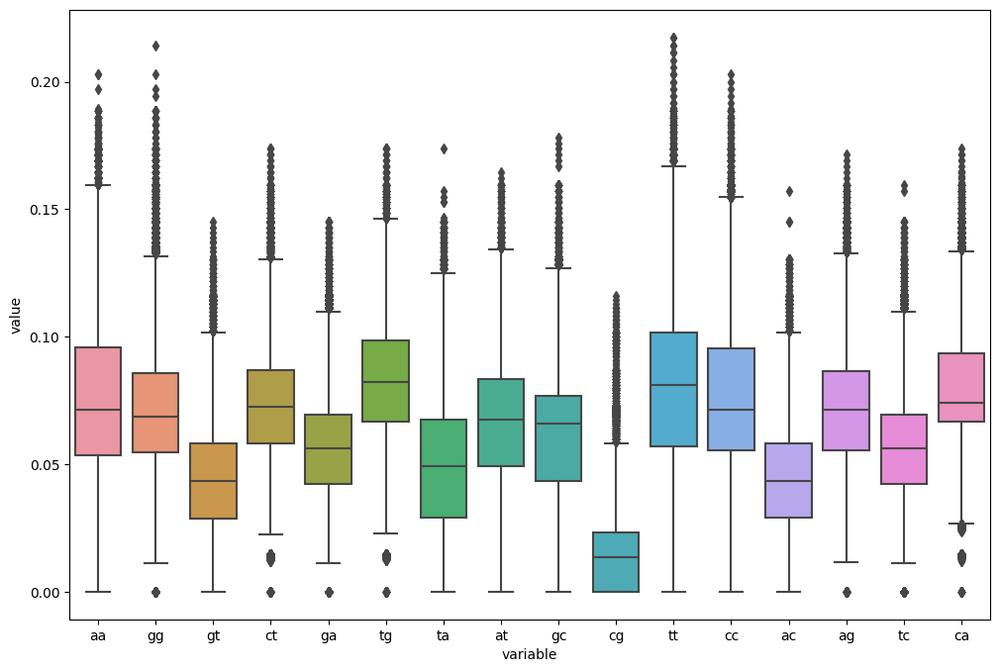

In [129]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 8))
sns.boxplot(data=melted_df, x="variable", y="value", ax=ax)

In [113]:
grouped_per_length = df_all.groupby("length", as_index=False)\
                           .agg({dinu: "sum" for dinu in dinucleotides_all} | {"start": "count"})\
                           .assign(totalBP=lambda ds: ds["start"] * (ds["length"]-1))

for col in dinucleotides_all:
    grouped_per_length[col] = grouped_per_length[col].div(grouped_per_length["totalBP"])
    
grouped_per_length.loc[:, "total"] = grouped_per_length[dinucleotides_all].apply(lambda row: row.sum(), axis=1)

unique = list(set(grouped_per_length["total"]))
assert abs(unique[0]-1.0) < 0.0001, f"{unique}"
grouped_per_length.drop(columns=["total"], inplace=True)

grouped_per_length

,length,aa,gg,gt,ct,ga,tg,ta,at,gc,cg,start,totalBP
0,60,0.153380,0.138400,0.097270,0.146812,0.111213,0.158225,0.052669,0.065545,0.062450,0.014037,640616,37796344
1,61,0.153262,0.138609,0.097056,0.146671,0.111404,0.158392,0.052496,0.065537,0.062440,0.014134,520557,31233420
2,62,0.153138,0.138833,0.096743,0.146322,0.111831,0.158530,0.052210,0.065809,0.062415,0.014169,421407,25705827
3,63,0.153629,0.138868,0.096563,0.146135,0.112209,0.158466,0.051831,0.066019,0.062197,0.014084,336028,20833736
4,64,0.153281,0.139397,0.096472,0.146514,0.112525,0.158543,0.051667,0.065610,0.062031,0.013960,266018,16759134
5,65,0.153539,0.140025,0.095971,0.146407,0.111707,0.158846,0.051594,0.065531,0.062652,0.013728,210951,13500864
6,66,0.153406,0.140546,0.095457,0.146549,0.111851,0.158816,0.051308,0.065680,0.062601,0.013787,169304,11004760
7,67,0.153295,0.141904,0.094785,0.146693,0.111038,0.158755,0.051246,0.065701,0.063043,0.013539,133217,8792322
8,68,0.152965,0.142955,0.094832,0.146466,0.111000,0.158586,0.050871,0.065727,0.063137,0.013461,106597,7141999
9,69,0.152696,0.143814,0.094068,0.146295,0.110829,0.159378,0.050511,0.065823,0.063282,0.013305,84731,5761708


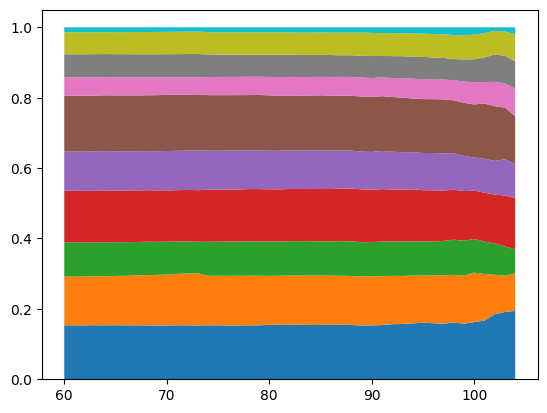

In [116]:
# t = df_all[dinucleotides_all + ["length"]]
plt.stackplot(grouped_per_length["length"], grouped_per_length[dinucleotides_all].T)
# plt.legend(loc='upper left')
plt.show()

In [14]:
!ls /storage/group/izg5139/default/external/quadrupia_database/g4/nonBDNA/primates/fasta

calculate_length.py		  mPonAbe1.pri.cur.20231205.fna.gz
chm13v2.0.fna.gz		  mPonPyg2.pri.cur.20231122.fna.gz
chromosome_lengths_primates.txt   mSymSyn1.pri.cur.20231205.fna.gz
mGorGor1.pri.cur.20231122.fna.gz  schedule_7.json
mPanPan1.pri.cur.20231122.fna.gz  submit.sh
mPanTro3.pri.cur.20231122.fna.gz


In [115]:
from Bio import SeqIO
import gzip

f = gzip.open("/storage/group/izg5139/default/external/quadrupia_database/g4/nonBDNA/primates/fasta/chm13v2.0.fna.gz", "rt")

for record in SeqIO.parse(f, "fasta"):

    seqID = record.id

    if seqID == "chrY":
        seq = str(record.seq).lower()
f.close()

In [53]:
chrY.iloc[0]['sequence']

'tcttcaccttgtgatccccttgccttggcctccaaatttgctgggattacaggcctgagccaagatccatatt'

In [55]:
chrY.iloc[0]

seqID                                                               chrY
start                                                           28661659
end                                                             28661732
sequence               tcttcaccttgtgatccccttgccttggcctccaaatttgctggga...
length                                                                73
#assembly_accession                                            chm13v2.0
chromosome                                                          chrY
chrLen                                                          62460029
gc_content                                                      0.493151
gt_content                                                      0.506849
Name: 3091554, dtype: object

In [54]:
chrY.loc[3091582]

seqID                                                               chrY
start                                                           28671315
end                                                             28671388
sequence               tcttgaccttgtgatccccttgccttggcctccaaatttgctggga...
length                                                                73
#assembly_accession                                            chm13v2.0
chromosome                                                          chrY
chrLen                                                          62460029
gc_content                                                      0.493151
gt_content                                                      0.520548
Name: 3091582, dtype: object

In [51]:
chrY.loc[3091582]['sequence']

'tcttgaccttgtgatccccttgccttggcctccaaatttgctgggattacaggcctgagccaagatccatatt'

In [8]:
chrY = df_all[df_all["seqID"] == "chrY"].query("start >= 28660071 & end <= 28673910")
chrY.head(40)

,seqID,start,end,sequence,length,#assembly_accession,chromosome,chrLen,gc_content,gt_content
3091554,chrY,28661659,28661732,tcttcaccttgtgatccccttgccttggcctccaaatttgctggga...,73,chm13v2.0,chrY,62460029,0.493151,0.506849
3091555,chrY,28661660,28661732,cttcaccttgtgatccccttgccttggcctccaaatttgctgggat...,72,chm13v2.0,chrY,62460029,0.500000,0.500000
3091556,chrY,28661661,28661732,ttcaccttgtgatccccttgccttggcctccaaatttgctgggatt...,71,chm13v2.0,chrY,62460029,0.492958,0.507042
3091557,chrY,28661662,28661732,tcaccttgtgatccccttgccttggcctccaaatttgctgggatta...,70,chm13v2.0,chrY,62460029,0.500000,0.500000
3091558,chrY,28661663,28661732,caccttgtgatccccttgccttggcctccaaatttgctgggattac...,69,chm13v2.0,chrY,62460029,0.507246,0.492754
3091559,chrY,28661664,28661732,accttgtgatccccttgccttggcctccaaatttgctgggattaca...,68,chm13v2.0,chrY,62460029,0.500000,0.500000
3091560,chrY,28661665,28661732,ccttgtgatccccttgccttggcctccaaatttgctgggattacag...,67,chm13v2.0,chrY,62460029,0.507463,0.507463
3091561,chrY,28661666,28661732,cttgtgatccccttgccttggcctccaaatttgctgggattacagg...,66,chm13v2.0,chrY,62460029,0.500000,0.515152
3091562,chrY,28661667,28661732,ttgtgatccccttgccttggcctccaaatttgctgggattacaggc...,65,chm13v2.0,chrY,62460029,0.492308,0.523077
3091563,chrY,28661668,28661732,tgtgatccccttgccttggcctccaaatttgctgggattacaggcc...,64,chm13v2.0,chrY,62460029,0.500000,0.515625


In [9]:
hsat1B = seq[28660071: 28673910]
len(hsat1B)

13839

In [39]:
import re

def is_zimin(x):
    match = re.search(r"([agct]+)([agct]+)\1([agct]+)\1\2\1", x)

    if match:
        return match
    return match

# import re

# def is_zimin(x):
#     match = re.search(r"([agct]+)([agct]+)\1", x)

#     if match:
#         return match
#     return match

In [37]:
sat = seq[28661659: 28661732] + 'tctgg' # + "|" + seq[28661732: 28661732+20]
sat

'tcttcaccttgtgatccccttgccttggcctccaaatttgctgggattacaggcctgagccaagatccatatttctgg'

In [ ]:
2n-X-2n

In [38]:
is_zimin(sat).groups()

('tct',
 'tcaccttgtgatccccttgccttggcctccaaatttgctgggattacaggcctgagccaagatccatatt')

In [42]:
is_zimin(sat).groups()

('t', 't', 'gctgggattacaggcctgagccaagatccata')

In [134]:
seq[28661659: 28661732]

'tcttcaccttgtgatccccttgccttggcctccaaatttgctgggattacaggcctgagccaagatccatatt'

In [40]:
hsat1B.find("gctgggattacaggcctgagccaagatccatatt")

1627

In [48]:
hsat1B[1550:1627+len("gctgggattacaggcctgagccaagatccatatt")+500]

'gacagcctttcactgtattggccaggatggccttgatctcttcaccttgtgatccccttgccttggcctccaaatttgctgggattacaggcctgagccaagatccatatttttttaaatgaaaaaaaatttgaaaggtactctgcttggtacaataatcaaatgtataaactgaggaataaatcataaccatgaaacatacttataactgcatatggaaaatacagaggataattttttaaataacatattttgaaagccttaactagtaatttgaagagctgacatttgaaaggccagtatgaatataccttcaaagcagcaacacaggatccccatgagaaaaagcaaactcagggaaaataaaaccacaaaggttcaatctcttctgacctttgaaagacacagcacagacagtggtccttaggacgaagagcaggagacccctaattccgtcaccatggcgatagggcataaacattgctgggtgagggcacaatccacattgtgaggtccaactgctgccaggaagacaggagtgcttttacatagaccgaaaggtcattgaaggctcagagttttgtttcaagaactgaatcccaagcccacac'

In [111]:
from lempel_ziv_complexity import lempel_ziv_complexity

In [113]:
df_centro_chrY = df_centro[df_centro["seqID"] == "chrY"]

In [121]:
from collections import defaultdict

kmer_length = 20
complexities = {}
regions = defaultdict(list)
for _, compartment in tqdm(df_centro_chrY.iterrows(), leave=True, position=0, total=df_centro_chrY.shape[0]):

    start = compartment['start']
    end = compartment['end']
    comp = compartment['compartment']

    seq_comp = seq[start-1: end]
    for i in range(len(seq_comp)-kmer_length+1):
        chunk = seq_comp[i:i+kmer_length]
        complexity = lempel_ziv_complexity(chunk)
        regions[comp].append(complexity)  




100%|██████████| 289/289 [02:13<00:00,  2.17it/s]


In [122]:
regions_mean = {comp: np.array(regions[comp]).mean() for comp in regions}
regions_mean

{'censat': 10.62151573807864,
 'ct': 10.549067464834271,
 'bsat': 10.733062424797904,
 'mon': 10.639972059722343,
 'hor': 10.663431206017957,
 'hsat3': 10.346191150360857,
 'gsat': 10.62709128265336,
 'hsat1B': 9.89904563856755}

In [120]:
regions_mean = {comp: np.array(regions[comp]).mean() for comp in regions}
regions_mean

{'censat': 28.559689038508555,
 'ct': 28.39057878072746,
 'bsat': 28.98533104426689,
 'mon': 28.620099682299106,
 'hor': 28.717956799793235,
 'hsat3': 26.260702010884604,
 'gsat': 28.553947238415176,
 'hsat1B': 25.994847078189764}

In [148]:
# df_all_c

In [130]:
df_centro_chrY = df_centro[df_centro["seqID"] == "chrY"].query('compartment == "hsat1B"')
df_centro_chrY.head()

,seqID,start,end,compartment,chromosome,chrLen
2430,chrY,28660072,28673910,hsat1B,chrY,62460029
2431,chrY,28673910,28686570,hsat1B,chrY,62460029
2433,chrY,29199768,29239364,hsat1B,chrY,62460029
2435,chrY,29320749,29356977,hsat1B,chrY,62460029
2437,chrY,30970139,31198733,hsat1B,chrY,62460029


In [150]:
df_all_c_73 = pd.read_table(
        BedTool.from_dataframe(df_all_c[["seqID", "start", "end"]]).sort().merge().fn, #.merge(c="4", o="distinct", delim="|").fn,
            header=None,
            names=["seqID", "start", "end"]#, "sequence"]
)
# df_all_c_73.loc[:, "length"] = df_all_c_73["sequence"].apply(len)
df_all_c_73

,seqID,start,end
0,chrY,28661659,28661732
1,chrY,28664078,28664151
2,chrY,28671315,28671388


In [152]:
hsat1B = seq[28660071:28673910]

complexities = []
kmer_length = 73
start = 28660072
indices = []
for i in range(len(hsat1B)-kmer_length+1):

    chunk = hsat1B[i:i+kmer_length]
    complexity = lempel_ziv_complexity(chunk)
    complexities.append(complexity)

    if start+i == 28661659 or start+i == 28664078 or start+i == 28671315:
        print("F")
        indices.append(i)

F
F
F


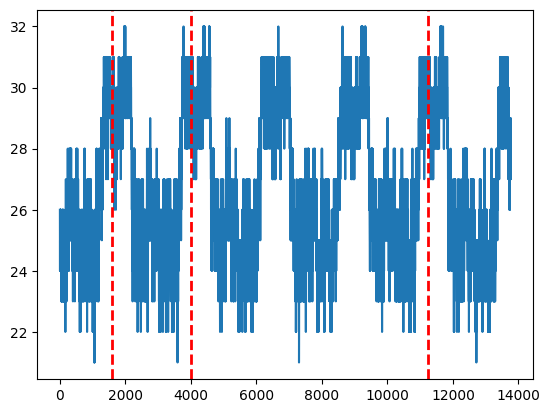

In [153]:
plt.plot(range(len(complexities)), complexities)
for i in indices:
    plt.axvline(i, lw=2.0, linestyle='--', color='red')

In [131]:
df_all_c = df_all[(df_all["seqID"] == "chrY") & (28660072 <= df_all["start"]) & (df_all["end"] <= 28673910)]
df_all_c

,seqID,start,end,sequence,length,#assembly_accession,chromosome,chrLen,gc_content,gt_content
3091554,chrY,28661659,28661732,tcttcaccttgtgatccccttgccttggcctccaaatttgctggga...,73,chm13v2.0,chrY,62460029,0.493151,0.506849
3091555,chrY,28661660,28661732,cttcaccttgtgatccccttgccttggcctccaaatttgctgggat...,72,chm13v2.0,chrY,62460029,0.500000,0.500000
3091556,chrY,28661661,28661732,ttcaccttgtgatccccttgccttggcctccaaatttgctgggatt...,71,chm13v2.0,chrY,62460029,0.492958,0.507042
3091557,chrY,28661662,28661732,tcaccttgtgatccccttgccttggcctccaaatttgctgggatta...,70,chm13v2.0,chrY,62460029,0.500000,0.500000
3091558,chrY,28661663,28661732,caccttgtgatccccttgccttggcctccaaatttgctgggattac...,69,chm13v2.0,chrY,62460029,0.507246,0.492754
3091559,chrY,28661664,28661732,accttgtgatccccttgccttggcctccaaatttgctgggattaca...,68,chm13v2.0,chrY,62460029,0.500000,0.500000
3091560,chrY,28661665,28661732,ccttgtgatccccttgccttggcctccaaatttgctgggattacag...,67,chm13v2.0,chrY,62460029,0.507463,0.507463
3091561,chrY,28661666,28661732,cttgtgatccccttgccttggcctccaaatttgctgggattacagg...,66,chm13v2.0,chrY,62460029,0.500000,0.515152
3091562,chrY,28661667,28661732,ttgtgatccccttgccttggcctccaaatttgctgggattacaggc...,65,chm13v2.0,chrY,62460029,0.492308,0.523077
3091563,chrY,28661668,28661732,tgtgatccccttgccttggcctccaaatttgctgggattacaggcc...,64,chm13v2.0,chrY,62460029,0.500000,0.515625


In [123]:
df_all.head()

,seqID,start,end,sequence,length,#assembly_accession,chromosome,chrLen,gc_content,gt_content
0,chr1,6006,6066,ccagatgcaactgcccaatctcggacattccagctaccagtattgt...,60,chm13v2.0,chr1,248387328,0.483333,0.400000
1,chr1,12615,12676,ccttgaagcacccccaagggcatcttctcaaagttggatgtgtgca...,61,chm13v2.0,chr1,248387328,0.491803,0.508197
2,chr1,12616,12676,cttgaagcacccccaagggcatcttctcaaagttggatgtgtgcat...,60,chm13v2.0,chr1,248387328,0.483333,0.516667
3,chr1,21609,21674,tcacaatggaccaggccaactcagtcaatgtggaggcagcatcagg...,65,chm13v2.0,chr1,248387328,0.538462,0.461538
4,chr1,21610,21674,cacaatggaccaggccaactcagtcaatgtggaggcagcatcaggt...,64,chm13v2.0,chr1,248387328,0.546875,0.453125


In [136]:
hsat1B.find(seq[28661659: 28661732])

1588

In [133]:
is_zimin(hsat1B).groups()

('tatat',
 'catatatagaatatattatacggttaatatacgtattaaatataaattatacatta',
 'actatatataatatatctgttatatataatacccattatacataatatatatattatgtctatattatatatagtataaaacaacatataataatatataattgtatatataaaatgtgacatataatatatattatattttatgacatatgtaatatatattatatattatgtataatacgttgtatgtataatacctatattaattatatattatatgactatgttattaattacatgtcacatatacatatattatatattttacatggaatataccggttacatataatatatactatgttacctataatgtataatttattacatgtaatataatgaatgtcatatattatatataatttataatattcaatatgtggaatgtgatatatataacatataatatatgatatatgatatacagtatatgatatataacatacaatttatgatacctaatatatatggtatacaatatatattttatgaaaagtattctatatgttttatattctgttatatataactatttgaaattatatataactgtataatattttatgtaaatatgtaatataatatatataaccatataatatattatatataactatatattatggtatatatacttttataacataatttacataaaatatcataatataatatatattatattatttcatattacataatatatattacatatcaccaaatataagtaacatacataatattaaaatatagtttatattatgttatattaaatatcatatatatcatgtatcatatgttctataatatatgttatacattatataatatgtatgttgtctattatgtgatatatataactatatatataattatattattatacatataactacataaacatgtaattctatatattttcattta

In [76]:
hsat1B

'tatatcatatatagaatatattatacggttaatatacgtattaaatataaattatacattatatatactatatataatatatctgttatatataatacccattatacataatatatatattatgtctatattatatatagtataaaacaacatataataatatataattgtatatataaaatgtgacatataatatatattatattttatgacatatgtaatatatattatatattatgtataatacgttgtatgtataatacctatattaattatatattatatgactatgttattaattacatgtcacatatacatatattatatattttacatggaatataccggttacatataatatatactatgttacctataatgtataatttattacatgtaatataatgaatgtcatatattatatataatttataatattcaatatgtggaatgtgatatatataacatataatatatgatatatgatatacagtatatgatatataacatacaatttatgatacctaatatatatggtatacaatatatattttatgaaaagtattctatatgttttatattctgttatatataactatttgaaattatatataactgtataatattttatgtaaatatgtaatataatatatataaccatataatatattatatataactatatattatggtatatatacttttataacataatttacataaaatatcataatataatatatattatattatttcatattacataatatatattacatatcaccaaatataagtaacatacataatattaaaatatagtttatattatgttatattaaatatcatatatatcatgtatcatatgttctataatatatgttatacattatataatatgtatgttgtctattatgtgatatatataactatatatataattatattattatacatataactacataaacatgtaattctatatattttcatttataatat

In [18]:
df_centro[(df_centro["seqID"] == "chrY") & (df_centro["compartment"] == "hsat1B")]

,seqID,start,end,compartment,chromosome,chrLen
2430,chrY,28660072,28673910,hsat1B,chrY,62460029
2431,chrY,28673910,28686570,hsat1B,chrY,62460029
2433,chrY,29199768,29239364,hsat1B,chrY,62460029
2435,chrY,29320749,29356977,hsat1B,chrY,62460029
2437,chrY,30970139,31198733,hsat1B,chrY,62460029
2439,chrY,31849743,32019017,hsat1B,chrY,62460029
2441,chrY,32840469,33090663,hsat1B,chrY,62460029
2443,chrY,33304751,33545528,hsat1B,chrY,62460029
2445,chrY,34544015,35728636,hsat1B,chrY,62460029
2447,chrY,36090298,36171446,hsat1B,chrY,62460029


In [ ]:
df_centro = pd.read_table("/storage/group/izg5139/default/external/quadrupia_database/g4/nonBDNA/primates/centromeres/chm13v2.0_censat_v2.0.bed", 
                          usecols=range(4), 
                          skiprows=1, 
                          header=None, 
                          names=["seqID", "start", "end", "compartment"]
                         )
df_centro.loc[:, "compartment"] = df_centro["compartment"].str.split("_", expand=True)[0]

chrSizes = dd.read_table("/storage/group/izg5139/default/external/quadrupia_database/g4/nonBDNA/primates/chrSizes/chromosome_prim*.txt").compute()
chrSizes.loc[:, "#assembly_accession"] = chrSizes["#assembly_accession"].apply(lambda y: '.'.join(y.split('.')[:2]))

chromosomes = chrSizes[chrSizes['#assembly_accession'] == 'chm13v2.0']\
                .drop(columns=["#assembly_accession"])

df_centro = df_centro.merge(chromosomes, how="left", left_on="seqID", right_on="chromosome")
extended_avoidmers = {f.name.split("_")[7].split(".")[0]: f for f in Path("/storage/group/izg5139/default/external/satellites/primates/zimming_extended").glob("*.txt")}

In [71]:
!pip install -q lempel_ziv_complexity

In [72]:
from lempel_ziv_complexity import lempel_ziv_complexity

In [74]:
s = '1001111011000010'

In [75]:
lempel_ziv_complexity(s)

8

In [77]:
nucleotide_mapping = {
                      'a': '00',
                      't': '11',
                      'g': '10',
                      'c': '01'
                     }
nucleotide_mapp

{'a': '00', 't': '11', 'g': '10', 'c': '01'}

In [106]:
regions = []
kmer_length = 500
for i in range(len(hsat1B_rec)-kmer_length+1):
    t = hsat1B_rec[i:i+kmer_length]

    complexity =  lempel_ziv_complexity(t)
    regions.append(complexity)  

In [110]:
for a in df_all['sequence'].values:
    print(a, lempel_ziv_complexity(a))

ccagatgcaactgcccaatctcggacattccagctaccagtattgtgagccaaatgaatc 25
ccttgaagcacccccaagggcatcttctcaaagttggatgtgtgcattttcctgagaggaa 27
cttgaagcacccccaagggcatcttctcaaagttggatgtgtgcattttcctgagaggaa 27
tcacaatggaccaggccaactcagtcaatgtggaggcagcatcaggtagacctggggctgaaact 27
cacaatggaccaggccaactcagtcaatgtggaggcagcatcaggtagacctggggctgaaact 26
acaatggaccaggccaactcagtcaatgtggaggcagcatcaggtagacctggggctgaaact 27
caatggaccaggccaactcagtcaatgtggaggcagcatcaggtagacctggggctgaaact 26
aatggaccaggccaactcagtcaatgtggaggcagcatcaggtagacctggggctgaaact 26
atggaccaggccaactcagtcaatgtggaggcagcatcaggtagacctggggctgaaact 25
ctaagttactggaattaattatggggtttgattctacatcatccagaaaagcctggatgccac 27
taagttactggaattaattatggggtttgattctacatcatccagaaaagcctggatgccac 26
aagttactggaattaattatggggtttgattctacatcatccagaaaagcctggatgccac 26
agttactggaattaattatggggtttgattctacatcatccagaaaagcctggatgccac 26
tcccaggccatgtggaagacctcacagggggaccaactgctgcctttcagcctggccgagg 27
cccaggccatgtggaagacctcacagggggaccaactgctgcctttcagcctggccgagg 26
gtcgtaagtacaaagct

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



ggcctcctgacttgatgagaatacaggcgtgcaccaccatgcctagctaattttttaaggaatt 28
gcctcctgacttgatgagaatacaggcgtgcaccaccatgcctagctaattttttaaggaatt 27
cctcctgacttgatgagaatacaggcgtgcaccaccatgcctagctaattttttaaggaatt 27
ctcctgacttgatgagaatacaggcgtgcaccaccatgcctagctaattttttaaggaatt 26
tcctgacttgatgagaatacaggcgtgcaccaccatgcctagctaattttttaaggaatt 26
accttccgttgccggatctccccggccaactacgagcctgtgcactggttcctggacaagac 26
ccttccgttgccggatctccccggccaactacgagcctgtgcactggttcctggacaagac 26
cttccgttgccggatctccccggccaactacgagcctgtgcactggttcctggacaagac 26
tgcttggtccttcccagctctgcctgccaggttcatagaagatgtgaaaaaccaggaggcca 28
gcttggtccttcccagctctgcctgccaggttcatagaagatgtgaaaaaccaggaggcca 27
cttggtccttcccagctctgcctgccaggttcatagaagatgtgaaaaaccaggaggcca 26
aagtatgagtcattccaaggcaaaattcttcttcagttgtgaagcatggaaccagacaagttttg 28
agtatgagtcattccaaggcaaaattcttcttcagttgtgaagcatggaaccagacaagttttg 28
gtatgagtcattccaaggcaaaattcttcttcagttgtgaagcatggaaccagacaagttttg 27
tatgagtcattccaaggcaaaattcttcttcagttgtgaagcatggaaccagacaagttttg 27
atgagtcatt

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



gctcagagaggttacagcgttaaaaagtaacgctaggatttggacccaggcaatctgact 26
tcagagaggttacagcgttaaaaagtaacgctaggatttggacccaggcaatctgactcc 26
atgtcacagaatcccgtcctgggaaaactcaaggtcaggtatgaattttttggttacgtgata 28
tgtcacagaatcccgtcctgggaaaactcaaggtcaggtatgaattttttggttacgtgata 27
gtcacagaatcccgtcctgggaaaactcaaggtcaggtatgaattttttggttacgtgata 27
tcacagaatcccgtcctgggaaaactcaaggtcaggtatgaattttttggttacgtgata 26
tcagcagatggaccttagcgatcacctggggccctcctattactaccaatgaggaaactga 26
cagcagatggaccttagcgatcacctggggccctcctattactaccaatgaggaaactga 26
ggacccttggcatcaatttaggtaaaatgcatgaggacaagtgttctgggaatattggaagctccaaga 29
gacccttggcatcaatttaggtaaaatgcatgaggacaagtgttctgggaatattggaagctccaaga 29
acccttggcatcaatttaggtaaaatgcatgaggacaagtgttctgggaatattggaagctccaaga 29
cccttggcatcaatttaggtaaaatgcatgaggacaagtgttctgggaatattggaagctccaaga 29
ccttggcatcaatttaggtaaaatgcatgaggacaagtgttctgggaatattggaagctccaaga 28
cttggcatcaatttaggtaaaatgcatgaggacaagtgttctgggaatattggaagctccaaga 28
ttggcatcaatttaggtaaaatgcatgaggacaagtgttctgggaatattggaagctc

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



 28
aaaaatctaattgtaggccaggcgcagtggctcatgcctgcaatcccagcactttgggaggcc 27
aaaatctaattgtaggccaggcgcagtggctcatgcctgcaatcccagcactttgggaggcc 26
aaatctaattgtaggccaggcgcagtggctcatgcctgcaatcccagcactttgggaggcc 27
aatctaattgtaggccaggcgcagtggctcatgcctgcaatcccagcactttgggaggcc 25
acaggccactggtgcaatggataacgcgtctgactacggatgagggaatttagcctggaat 26
caggccactggtgcaatggataacgcgtctgactacggatgagggaatttagcctggaat 27
ccatacggtggactactgaaagctttctgcctaagcttgggaaccatgcaattatgcccattc 28
catacggtggactactgaaagctttctgcctaagcttgggaaccatgcaattatgcccattc 27
atacggtggactactgaaagctttctgcctaagcttgggaaccatgcaattatgcccattc 27
tacggtggactactgaaagctttctgcctaagcttgggaaccatgcaattatgcccattc 27
aagcaaaggttagacataagtcttgcaatggagcttcaccactgatgcagtgtaactggat 27
agcaaaggttagacataagtcttgcaatggagcttcaccactgatgcagtgtaactggat 25
ggaactcaaggcctgattggttcttcctaagcaggacacatcaggttgtcagggcaaccggcctt 28
gaactcaaggcctgattggttcttcctaagcaggacacatcaggttgtcagggcaaccggcctt 28
aactcaaggcctgattggttcttcctaagcaggacacatcaggttgtcagggcaaccggcctt 28
actcaaggcc

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




ttccttatctgtagtgctaacataaccatccaaggggttcactttgccccctgcctagac 26
agctgttctagcgaattaatcaaagccaatgagagattcatgggaatccctgatttatagct 27
gctgttctagcgaattaatcaaagccaatgagagattcatgggaatccctgatttatagct 26
ctgttctagcgaattaatcaaagccaatgagagattcatgggaatccctgatttatagctggtcagtcag 29
tgttctagcgaattaatcaaagccaatgagagattcatgggaatccctgatttatagctggtcagtcag 29
gttctagcgaattaatcaaagccaatgagagattcatgggaatccctgatttatagctggtcagtcag 29
ttctagcgaattaatcaaagccaatgagagattcatgggaatccctgatttatagctggtcagtcag 28
tctagcgaattaatcaaagccaatgagagattcatgggaatccctgatttatagctggtcagtcag 29
ctagcgaattaatcaaagccaatgagagattcatgggaatccctgatttatagctggtcagtcag 28
tagcgaattaatcaaagccaatgagagattcatgggaatccctgatttatagctggtcagtcag 27
agcgaattaatcaaagccaatgagagattcatgggaatccctgatttatagctggtcagtcag 27
gcgaattaatcaaagccaatgagagattcatgggaatccctgatttatagctggtcagtcag 27
cgaattaatcaaagccaatgagagattcatgggaatccctgatttatagctggtcagtcag 27
gaattaatcaaagccaatgagagattcatgggaatccctgatttatagctggtcagtcag 26
tcccaaagtgctgggattacaggcttgagccaccatgcctggcga

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




taattttacgtataaagaacatggaggccaggttcagtggctcttgcctgcaatcccgac 26
aacacattaggtagactggatgcccaaaggccaatccaacctcatgtcttcctggcatttc 27
acacattaggtagactggatgcccaaaggccaatccaacctcatgtcttcctggcatttc 25
tggatcacctgaagtcaggagttcaagaccagcctggccaacatggtgaaaccccgtctctactaa 28
ggatcacctgaagtcaggagttcaagaccagcctggccaacatggtgaaaccccgtctctactaa 28
gatcacctgaagtcaggagttcaagaccagcctggccaacatggtgaaaccccgtctctactaa 27
atcacctgaagtcaggagttcaagaccagcctggccaacatggtgaaaccccgtctctactaa 27
tcacctgaagtcaggagttcaagaccagcctggccaacatggtgaaaccccgtctctactaa 27
cacctgaagtcaggagttcaagaccagcctggccaacatggtgaaaccccgtctctactaa 27
acctgaagtcaggagttcaagaccagcctggccaacatggtgaaaccccgtctctactaa 26
catagcttaatcaaggtcacaaagtgactgactggccaagctggtactcagtcttatgat 26
tagcttaatcaaggtcacaaagtgactgactggccaagctggtactcagtcttatgatagtccagggct 30
agcttaatcaaggtcacaaagtgactgactggccaagctggtactcagtcttatgatagtccagggct 29
gcttaatcaaggtcacaaagtgactgactggccaagctggtactcagtcttatgatagtccagggct 28
cttaatcaaggtcacaaagtgactgactggccaagctggtactcagtcttatgatag

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



tctactgaaatcagagtcacatgtgcaagctgaatgatgccattaggcccataaccggttga 27
ctactgaaatcagagtcacatgtgcaagctgaatgatgccattaggcccataaccggttga 26
tactgaaatcagagtcacatgtgcaagctgaatgatgccattaggcccataaccggttga 26
ttaaaaggcagacatgccttgagtttgactgtcagttctcccacttactgggcaacgtatg 26
taaaaggcagacatgccttgagtttgactgtcagttctcccacttactgggcaacgtatg 27
aagttaggtgacatgccaaggtcacccagctactaactagctgaacttgagacctgaagcctagt 28
agttaggtgacatgccaaggtcacccagctactaactagctgaacttgagacctgaagcctagt 27
gttaggtgacatgccaaggtcacccagctactaactagctgaacttgagacctgaagcctagt 27
ttaggtgacatgccaaggtcacccagctactaactagctgaacttgagacctgaagcctagt 27
taggtgacatgccaaggtcacccagctactaactagctgaacttgagacctgaagcctagt 27
aggtgacatgccaaggtcacccagctactaactagctgaacttgagacctgaagcctagt 26
tgacatgccaaggtcacccagctactaactagctgaacttgagacctgaagcctagtgtctcaact 29
gacatgccaaggtcacccagctactaactagctgaacttgagacctgaagcctagtgtctcaact 27
acatgccaaggtcacccagctactaactagctgaacttgagacctgaagcctagtgtctcaact 28
catgccaaggtcacccagctactaactagctgaacttgagacctgaagcctagtgtctcaact 27
atg

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



ctcttcccatggcaatggcttagaaggaagtccagccttgagcagtggacatgttgtttgatcagtt 28
tcttcccatggcaatggcttagaaggaagtccagccttgagcagtggacatgttgtttgatcagtt 27
cttcccatggcaatggcttagaaggaagtccagccttgagcagtggacatgttgtttgatcagtt 28
ttcccatggcaatggcttagaaggaagtccagccttgagcagtggacatgttgtttgatcagtt 28
tcccatggcaatggcttagaaggaagtccagccttgagcagtggacatgttgtttgatcagtt 28
cccatggcaatggcttagaaggaagtccagccttgagcagtggacatgttgtttgatcagtt 26
ccatggcaatggcttagaaggaagtccagccttgagcagtggacatgttgtttgatcagtt 27
catggcaatggcttagaaggaagtccagccttgagcagtggacatgttgtttgatcagtt 25
catccagttcagccaaaccaacacatattagctgaatttcagaactgcctgattcttcttgggca 27
atccagttcagccaaaccaacacatattagctgaatttcagaactgcctgattcttcttgggca 26
tccagttcagccaaaccaacacatattagctgaatttcagaactgcctgattcttcttgggca 27
ccagttcagccaaaccaacacatattagctgaatttcagaactgcctgattcttcttgggca 26
cagttcagccaaaccaacacatattagctgaatttcagaactgcctgattcttcttgggca 27
agttcagccaaaccaacacatattagctgaatttcagaactgcctgattcttcttgggca 26
ctggagctaaagtcatgtgaatgctctatggggctgaacatccatgatggccccattcac 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



KeyboardInterrupt: 

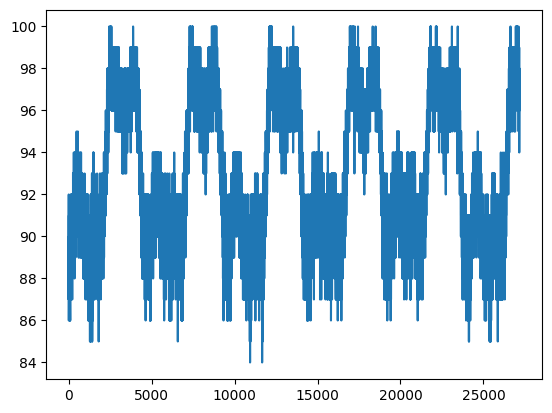

In [107]:
plt.plot(range(len(regions)), regions)

In [79]:
hsat1B_rec = ''.join(nucleotide_mapping[c] for c in hsat1B)
hsat1B_rec

'110011001101001100110011001000001100110011110011000110101111000011001100011011001111000000110011000000111100110001001111001100110011000111001100110011000011001100110111101111001100110011000011000101010011110011000100110000110011001100110011110011101101110011001111001100110011001011001100000000010000010011001100001100001100110011000011111011001100110011000000001110111000010011001100001100110011001111001100111111110011100001001100111011000011001100110011110011001100111100111011001100001100011011111011001110110011000011000101110011001111000011110011001100111100110011100001110011101111001111000011110001001110110100010011001100010011001100111100110011001111111100010011101000001100110001011010111100010011001100001100110011000111001110111100010111001100001110110011000011111100111100010011101100001100110000111000001110110100110011001111001100110011000011111100110000110011110100001100111011101000001110111000110011001100110000010011001100001100110011100011001100111000110011000100101100110011100